# **Week 5 Solutions**

### Please have a good hard go at your challenge questions before looking through these solutions.

### Here is a bit of motivation cat for you to give those challenges your best shot.

## **You've got this!**

![motivation-cat](../resources/images/MotivationCat.png)


# **Challenge Task 1: Explore & Analyse the Data**

You've now covered a wide range of topics—this is your chance to apply what you've learned! This task is designed to be open-ended, giving you the freedom to explore the dataset creatively and independently.

During our recap session, you’ll present:
- What you did with the data
- What insights you discovered


### **Guidelines**
- **Use Google freely** to look up how to use libraries and functions.
- **Avoid using AI assistants** for this task. This is your opportunity to build confidence by working through challenges yourself.
- **Choose one city’s dataset only** (For example just use the tables in the `LOA` folder).
  - Want a tougher challenge? Try combining data from multiple cities.


### **Ideas to Get You Started**
1. **Table Merging**  
   Can you merge or join tables like `volume`, `duration`, `e_price`, and `s_price`? They share similar structures.

2. **Missing Data**  
   Are there any missing values? How will you handle them—drop, fill, or something else?

3. **Relationships & Visuals**  
   Are there patterns or correlations between columns? What visualizations can you create to show these?

4. **Insights & Conclusions**  
   - Which sites have the highest usage?
   - What factors influence charger usage?


### **About the Dataset**
This dataset is based on real-world data collected by researchers. You can learn more about it [here](https://github.com/IntelligentSystemsLab/CHARGED)


### **Why This Matters**
You’ll be using this dataset again over the next two weeks—so the effort you put in now will pay off later!

### **Hint**
The function `df.melt()` might come in handy for reshaping your data.


In [361]:
import warnings
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
# Suppress all warnings
warnings.filterwarnings("ignore")

Import all the datasets for Los Angeles

In [239]:
chargers_df = pd.read_csv("challengedata/LOA/chargers.csv")
duration_df = pd.read_csv("challengedata/LOA/duration.csv")
chargefee_df = pd.read_csv("challengedata/LOA/e_price.csv")
servicefee_df = pd.read_csv("challengedata/LOA/s_price.csv")
sites_df = pd.read_csv("challengedata/LOA/sites.csv")
volume_df = pd.read_csv("challengedata/LOA/volume.csv")
weather_df = pd.read_csv("challengedata/LOA/weather.csv")

We won't end up using the chargers_df. This is because a site has multiple chargers, and so we will just use the site has the location rather than drilling down to each charger at the site. But we can still show what the table looks like for reference.

In [240]:
chargers_df

,charger_id,longitude,latitude,site,total_duration,total_volume,avg_power
0,100059,-118.343357,33.838359,0,3936.166667,25983.358333,6.600552
1,120369,-118.343342,33.838405,0,4223.875000,27882.233333,6.600440
2,10093961,-118.326140,33.918377,1,5110.000000,33726.000000,6.600000
3,10137141,-118.494087,34.014242,2,2505.166667,16534.100000,6.600000
4,731791,-118.493579,34.014218,2,3583.916667,23653.850000,6.600000
...,...,...,...,...,...,...,...
501,9292461,-118.452092,34.019740,224,3280.041667,21648.275000,6.600000
502,9353331,-118.256885,34.049598,225,3946.500000,26060.875000,6.602787
503,9535821,-118.276187,34.146595,226,495.125000,5946.500000,12.006949
504,96451,-118.216896,34.139369,227,3646.375000,24114.425000,6.609108


The duration, e_price, s_price and volume tables are originally all in long format. This means each column is the site_id. So we need to use the melt method to put all the site_id's into one column. This makes the table very long rather than wide, and makes it easier to work with later.

In [366]:
# Rename the unnamed column to a more approriate name 'datetime'
duration_df = duration_df.rename(columns={'Unnamed: 0':'datetime'})

# Convert the 'datetime' column to datetime format
duration_df['datetime'] = pd.to_datetime(duration_df['datetime'])

# Melt the table so that it is long rather than wide
duration_long_df = duration_df.melt(id_vars='datetime',var_name='site_id',value_name = 'duration')

# Convert 'site_id' to integer
duration_long_df['site_id'] = duration_long_df['site_id'].astype(int)


# Repeat for the charging fee table
chargefee_df = chargefee_df.rename(columns={'time':'datetime'})
chargefee_df['datetime'] = pd.to_datetime(chargefee_df['datetime'])
chargefee_long_df = chargefee_df.melt(id_vars='datetime',var_name='site_id',value_name='charging_fee')
chargefee_long_df['site_id'] = chargefee_long_df['site_id'].astype(int)

chargefee_long_df



,datetime,site_id,charging_fee
0,2023-04-01 00:00:00,0,0.0
1,2023-04-01 01:00:00,0,0.0
2,2023-04-01 02:00:00,0,0.0
3,2023-04-01 03:00:00,0,0.0
4,2023-04-01 04:00:00,0,0.0
...,...,...,...
1005763,2023-09-30 19:00:00,99,0.0
1005764,2023-09-30 20:00:00,99,0.0
1005765,2023-09-30 21:00:00,99,0.0
1005766,2023-09-30 22:00:00,99,0.0


We will add some extra date and time columns to the volume table. This will make our lives easier later on when we start merging tables and then aggregating per hour and per day.

In [ ]:
volume_df = volume_df.rename(columns={'Unnamed: 0':'datetime'})
volume_df['datetime'] = pd.to_datetime(volume_df['datetime'])
volume_df['time'] = volume_df['datetime'].dt.time
volume_df['time_str'] = volume_df['datetime'].dt.strftime('%H:%M')
volume_df['date'] = volume_df['datetime'].dt.date
volume_df['date_str'] = volume_df['datetime'].dt.strftime('%Y-%m-%d')

volume_long_df = volume_df.melt(id_vars=['datetime','date','date_str','time','time_str'],var_name='site_id',value_name='volume')
volume_long_df['site_id'] = volume_long_df['site_id'].astype(int)
volume_long_df

There are no service fees in the Los Angeles area, so we won't end up using it. It is just here for reference.

In [365]:
servicefee_df = servicefee_df.rename(columns={'time':'datetime'})
servicefee_df['datetime'] = pd.to_datetime(servicefee_df['datetime'])
servicefee_long_df = servicefee_df.melt(id_vars='datetime',var_name='site_id',value_name='service_fee')
servicefee_long_df['site_id'] = servicefee_long_df['site_id'].astype(int)

The key point of interest in the sites table is the longitude and latitude position of each site. We will use this information later to make some visuals based on location.

In [367]:
sites_lat_lng = sites_df[['site_id','latitude','longitude']]
sites_lat_lng

,site_id,latitude,longitude
0,0,33.838382,-118.343349
1,1,33.918377,-118.326140
2,2,34.014175,-118.493634
3,3,34.092760,-118.378278
4,4,34.020010,-118.277216
...,...,...,...
224,224,34.019740,-118.452092
225,225,34.049598,-118.256885
226,226,34.146595,-118.276187
227,227,34.139369,-118.216896


The weather dataframe contains a lot of different values. We are going to filter out some of them that aren't useful.

In [368]:
weather_df = weather_df.rename(columns={'time':'datetime'}) # We want to keep the column naming convention consistent
weather_df['datetime'] = pd.to_datetime(weather_df['datetime'])
weather_df

,datetime,temp,feelslike,humidity,dew,precip,snow,snowdepth,preciptype,windgust,windspeed,winddir,pressure,visibility,cloudcover,solarradiation,solarenergy,uvindex,conditions
0,2023-04-01 00:00:00,13.3,13.3,75.47,9.1,0.0,0,0,NaN,7.2,0.7,328.0,1020.9,16.0,5.6,0.0,0.0,0,0
1,2023-04-01 01:00:00,12.3,12.3,78.38,8.7,0.0,0,0,NaN,6.5,0.5,344.0,1020.8,16.0,1.9,0.0,0.0,0,0
2,2023-04-01 02:00:00,11.2,11.2,84.07,8.6,0.0,0,0,NaN,7.2,0.0,0.0,1020.4,16.0,1.9,0.0,0.0,0,0
3,2023-04-01 03:00:00,10.8,10.8,84.27,8.2,0.0,0,0,NaN,7.9,0.0,0.0,1020.2,16.0,1.9,0.0,0.0,0,0
4,2023-04-01 04:00:00,10.2,10.2,84.41,7.6,0.0,0,0,NaN,8.3,0.7,43.0,1020.0,16.0,1.9,0.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4387,2023-09-30 19:00:00,18.6,18.6,73.66,13.8,0.0,0,0,NaN,26.3,4.0,209.0,1009.8,16.0,52.2,0.0,0.0,0,2
4388,2023-09-30 20:00:00,18.3,18.3,73.88,13.6,0.0,0,0,NaN,20.9,6.3,263.0,1010.1,16.0,88.0,0.0,0.0,0,2
4389,2023-09-30 21:00:00,18.3,18.3,61.43,10.7,0.0,0,0,NaN,15.5,2.6,290.0,1010.4,16.0,48.4,0.0,0.0,0,2
4390,2023-09-30 22:00:00,18.1,18.1,64.65,11.3,0.0,0,0,NaN,10.8,9.4,266.0,1010.7,16.0,99.4,0.0,0.0,0,1


We are going to remove some columns from the weather dataframe as they give no value to what we are doing, have missing values, or show similar information available in other columns.

The dropped columns are:
1. temp and humidity - the feelslike is a calculated temperature that takes into account the actual temperature and dewpoint. Dewpoint is a more reliable measure of comfort and mugginess compared to humidity.  Feelslike and dewpoint are commonly used in forecasting as it better reflects customer's behaviour. For example, a person is more likely to be comfortable at 25C with low humidity, compared to 25C with very high humidity.
2. snow and snowdepth - It very rarely snows in Los Angeles, these columns are both empty
3. preciptype - A value that is either nan or rain. We could use this to create a binary value of 0 (no rain) and 1 (rain), however it won't add much to the data exploration we are doing.
4. winddir - The direction of the wind realistically won't impact a person's charging behaviour.
5. solarenergy - Solar radiation and solar energy are very closely linearly related. So we can remove one as both give us very similar information.
6. uvindex - Very closely related with solar radiation. We can drop it to prevent multicollinearity in the dataset.
7. conditions - Most of this information can be inferred from other columns

We can see below that there are relationships between temp, humidity, dew and feelslike. So we can keep dew and feelslike to capture a majority of the relationships without making the dataset too big.

<Figure size 640x480 with 0 Axes>

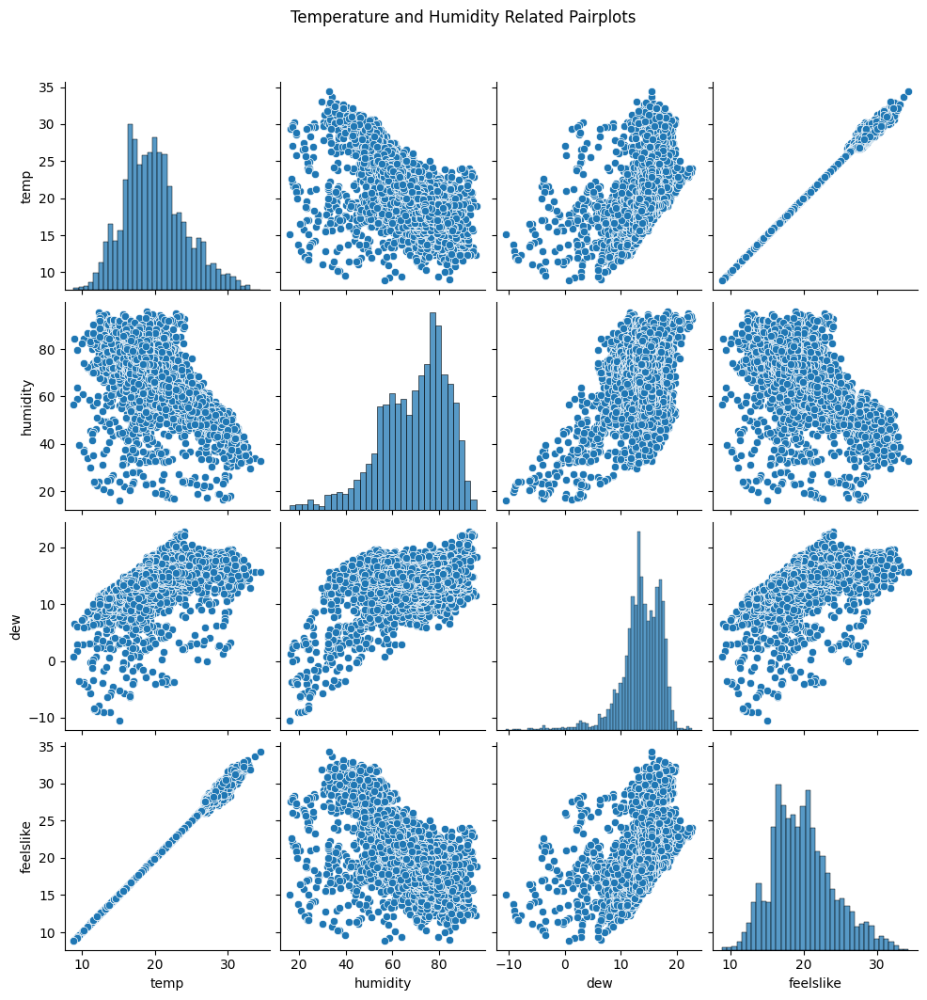

In [420]:
import seaborn as sns
plt.figure()
plot = sns.pairplot(weather_df[['temp','humidity','dew','feelslike']])
plot.fig.suptitle('Temperature and Humidity Related Pairplots', y=1.06)
plt.show()

We can see solarradiation, solarenergy and uvindex are closely related. We can remove two of them and still keep a lot of information.

<Figure size 640x480 with 0 Axes>

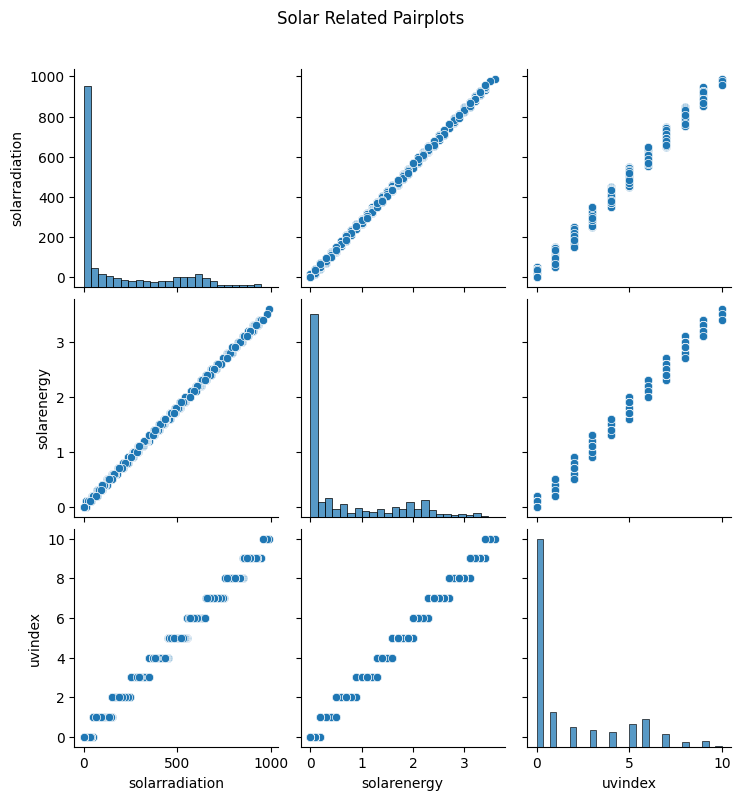

In [421]:
plt.figure()
plot = sns.pairplot(weather_df[['solarradiation','solarenergy','uvindex']])
plot.fig.suptitle('Solar Related Pairplots', y=1.06)
plt.show()

In [249]:
weather_small_df = weather_df.drop(columns=['temp','humidity','snow','snowdepth','preciptype','winddir','solarenergy','uvindex','conditions'])
weather_small_df

,datetime,feelslike,dew,precip,windgust,windspeed,pressure,visibility,cloudcover,solarradiation
0,2023-04-01 00:00:00,13.3,9.1,0.0,7.2,0.7,1020.9,16.0,5.6,0.0
1,2023-04-01 01:00:00,12.3,8.7,0.0,6.5,0.5,1020.8,16.0,1.9,0.0
2,2023-04-01 02:00:00,11.2,8.6,0.0,7.2,0.0,1020.4,16.0,1.9,0.0
3,2023-04-01 03:00:00,10.8,8.2,0.0,7.9,0.0,1020.2,16.0,1.9,0.0
4,2023-04-01 04:00:00,10.2,7.6,0.0,8.3,0.7,1020.0,16.0,1.9,0.0
...,...,...,...,...,...,...,...,...,...,...
4387,2023-09-30 19:00:00,18.6,13.8,0.0,26.3,4.0,1009.8,16.0,52.2,0.0
4388,2023-09-30 20:00:00,18.3,13.6,0.0,20.9,6.3,1010.1,16.0,88.0,0.0
4389,2023-09-30 21:00:00,18.3,10.7,0.0,15.5,2.6,1010.4,16.0,48.4,0.0
4390,2023-09-30 22:00:00,18.1,11.3,0.0,10.8,9.4,1010.7,16.0,99.4,0.0


We can now merge most of the tables together as they all have the same joining fields.

In [369]:
charging_df = (
    volume_long_df
    .merge(duration_long_df, how='left', on=['datetime', 'site_id'])
    .merge(chargefee_long_df, how='left', on=['datetime', 'site_id'])
    .merge(weather_small_df, how='left', on='datetime')
)

charging_df

,datetime,date,date_str,time,time_str,site_id,volume,duration,charging_fee,feelslike,dew,precip,windgust,windspeed,pressure,visibility,cloudcover,solarradiation
0,2023-04-01 00:00:00,2023-04-01,2023-04-01,00:00:00,00:00,0,6.600000,1.000000,0.0,13.3,9.1,0.0,7.2,0.7,1020.9,16.0,5.6,0.0
1,2023-04-01 01:00:00,2023-04-01,2023-04-01,01:00:00,01:00,0,6.050000,0.916667,0.0,12.3,8.7,0.0,6.5,0.5,1020.8,16.0,1.9,0.0
2,2023-04-01 02:00:00,2023-04-01,2023-04-01,02:00:00,02:00,0,7.150000,1.083333,0.0,11.2,8.6,0.0,7.2,0.0,1020.4,16.0,1.9,0.0
3,2023-04-01 03:00:00,2023-04-01,2023-04-01,03:00:00,03:00,0,6.600000,1.000000,0.0,10.8,8.2,0.0,7.9,0.0,1020.2,16.0,1.9,0.0
4,2023-04-01 04:00:00,2023-04-01,2023-04-01,04:00:00,04:00,0,6.050000,0.916667,0.0,10.2,7.6,0.0,8.3,0.7,1020.0,16.0,1.9,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005763,2023-09-30 19:00:00,2023-09-30,2023-09-30,19:00:00,19:00,99,5.092915,0.771654,0.0,18.6,13.8,0.0,26.3,4.0,1009.8,16.0,52.2,0.0
1005764,2023-09-30 20:00:00,2023-09-30,2023-09-30,20:00:00,20:00,99,5.064332,0.767323,0.0,18.3,13.6,0.0,20.9,6.3,1010.1,16.0,88.0,0.0
1005765,2023-09-30 21:00:00,2023-09-30,2023-09-30,21:00:00,21:00,99,5.035749,0.762992,0.0,18.3,10.7,0.0,15.5,2.6,1010.4,16.0,48.4,0.0
1005766,2023-09-30 22:00:00,2023-09-30,2023-09-30,22:00:00,22:00,99,5.007166,0.758662,0.0,18.1,11.3,0.0,10.8,9.4,1010.7,16.0,99.4,0.0


Check if there are any missing values

In [371]:
charging_df.isnull().sum()

datetime          0
date              0
date_str          0
time              0
time_str          0
site_id           0
volume            0
duration          0
charging_fee      0
feelslike         0
dew               0
precip            0
windgust          0
windspeed         0
pressure          0
visibility        0
cloudcover        0
solarradiation    0
dtype: int64

Remove any sites that have not been used (duration and volume both equal 0)

In [375]:
# Sum all the duration and volume values for each site
charging_grouped_df = (
    charging_df.groupby(by='site_id')
    .agg({
        'duration':'sum',
        'volume':'sum',
        })
    .reset_index())

# sort the site id's
charging_grouped_df = charging_grouped_df.sort_values(by='site_id',ascending=True)

# create a list of all site id's that have more than 0 duration and volume data
used_site_id_list = charging_grouped_df.loc[(charging_grouped_df['duration']>0) & (charging_grouped_df['volume'] > 0)]['site_id'].tolist()

# filter the original data for only sites being used
charging_filtered_df = charging_df[charging_df['site_id'].isin(used_site_id_list)]

charging_filtered_df

,datetime,date,date_str,time,time_str,site_id,volume,duration,charging_fee,feelslike,dew,precip,windgust,windspeed,pressure,visibility,cloudcover,solarradiation
0,2023-04-01 00:00:00,2023-04-01,2023-04-01,00:00:00,00:00,0,6.600000,1.000000,0.0,13.3,9.1,0.0,7.2,0.7,1020.9,16.0,5.6,0.0
1,2023-04-01 01:00:00,2023-04-01,2023-04-01,01:00:00,01:00,0,6.050000,0.916667,0.0,12.3,8.7,0.0,6.5,0.5,1020.8,16.0,1.9,0.0
2,2023-04-01 02:00:00,2023-04-01,2023-04-01,02:00:00,02:00,0,7.150000,1.083333,0.0,11.2,8.6,0.0,7.2,0.0,1020.4,16.0,1.9,0.0
3,2023-04-01 03:00:00,2023-04-01,2023-04-01,03:00:00,03:00,0,6.600000,1.000000,0.0,10.8,8.2,0.0,7.9,0.0,1020.2,16.0,1.9,0.0
4,2023-04-01 04:00:00,2023-04-01,2023-04-01,04:00:00,04:00,0,6.050000,0.916667,0.0,10.2,7.6,0.0,8.3,0.7,1020.0,16.0,1.9,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1005763,2023-09-30 19:00:00,2023-09-30,2023-09-30,19:00:00,19:00,99,5.092915,0.771654,0.0,18.6,13.8,0.0,26.3,4.0,1009.8,16.0,52.2,0.0
1005764,2023-09-30 20:00:00,2023-09-30,2023-09-30,20:00:00,20:00,99,5.064332,0.767323,0.0,18.3,13.6,0.0,20.9,6.3,1010.1,16.0,88.0,0.0
1005765,2023-09-30 21:00:00,2023-09-30,2023-09-30,21:00:00,21:00,99,5.035749,0.762992,0.0,18.3,10.7,0.0,15.5,2.6,1010.4,16.0,48.4,0.0
1005766,2023-09-30 22:00:00,2023-09-30,2023-09-30,22:00:00,22:00,99,5.007166,0.758662,0.0,18.1,11.3,0.0,10.8,9.4,1010.7,16.0,99.4,0.0


Now we can start making some plots. This first one will be a map of the total usage of each site.

In [253]:
site_charging_df = charging_filtered_df.groupby('site_id').agg({'duration':'sum','volume':'sum','charging_fee':'mean'}).reset_index()

site_charging_df = site_charging_df.merge(sites_df[['site_id','longitude','latitude']], how='left', on='site_id')

site_charging_df

We will use plotly to make a scatter map. This lets us easily overlay some dots on a map. We can also zoom the plot, hover over each site to gain more information and download the plot as a png. 

Documentation on plotly scatter_map can be found [here](https://plotly.com/python-api-reference/generated/plotly.express.scatter_map.html)

In [422]:
import plotly.express as px

fig = px.scatter_map(
    site_charging_df,
    lat='latitude',
    lon='longitude',
    hover_name='site_id',
    hover_data='volume',
    color='volume',
    size='volume',
    zoom=9,
    height=800,
    width=1200,
    map_style='dark', 
    title='EV Charger Total Usage (kWh) in Los Angeles',
    color_continuous_scale='sunset'
    )


fig.show(renderer='notebook')

Now we can try and see if there are any relationships between the charging behaviour and the weather.

In [376]:
# drop any columns that won't contribute to the correlation heatmap
charging_correlation_df = charging_filtered_df.drop(columns=['datetime','date','date_str','time','time_str'])

# calculate the correlation between each variable
correlation_matrix = charging_correlation_df.corr(method='pearson')

The main thing we are interested in is how the weather correlates with the volume, duration and charging fees. However, from the correlation heatmap below we can see that there is essentially no correlation between any weather factors. Therefore we can safely make the conclusions that a person's charging behaviour is not heavily impacted by weather conditions. Or can we?

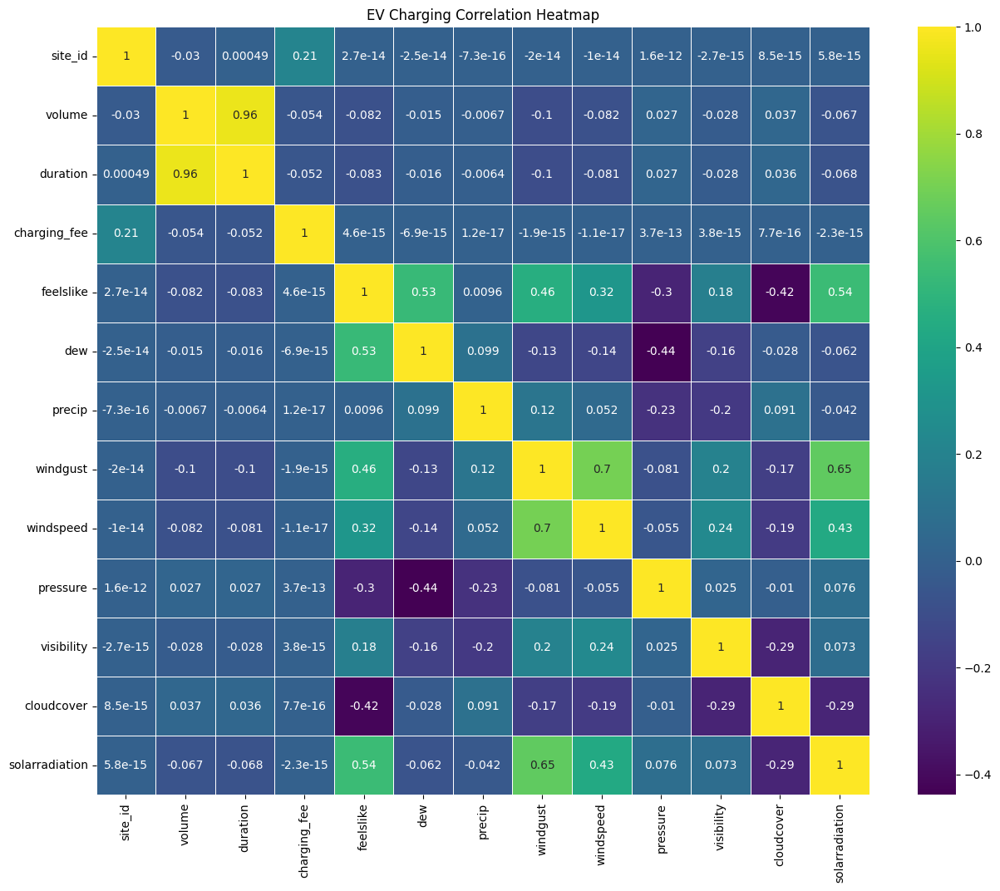

In [423]:
import seaborn as sns
plt.figure(figsize=(15,12))
sns.heatmap(correlation_matrix, annot=True, linewidths=.5, cmap="viridis")
plt.title('EV Charging Correlation Heatmap')
plt.show()

Now what if we aggregate all the sites together to get a daily outlook? It is important to think about how we might want to aggregate each value.

We can see there is a bit more correlation with the feels like and dew point. So maybe a customer is more inclined to charge on cool days?

This exercise is important in showing us that depending on how we aggregate data, we can see very different results.

In this case, we are looking at the relationship between weather and all sites together on each day. Whilst the correlation matrix above showed us the relationship on every site during each hour of each day.

In [377]:
daily_charging_df = charging_filtered_df.groupby(by='date').agg(
    {
        'volume':'sum',
        'duration':'sum',
        'charging_fee':'mean',
        'feelslike':'mean',
        'dew':'mean',
        'precip':'mean',
        'windgust':'mean',
        'windspeed':'mean',
        'pressure':'mean',
        'visibility':'mean',
        'cloudcover':'mean',
        'solarradiation':'mean'
    })

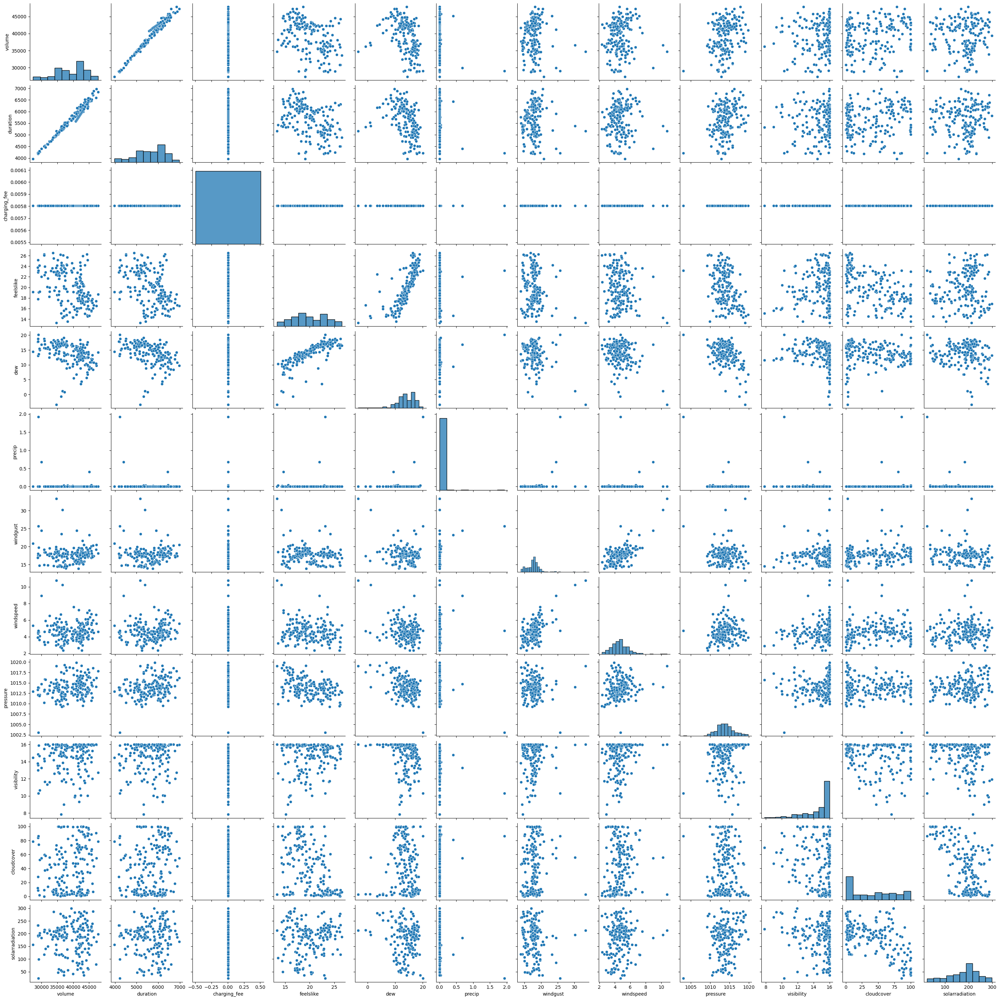

In [378]:
sns.pairplot(daily_charging_df)

The charging fee stays the same across all days, so no correlation is calculated.

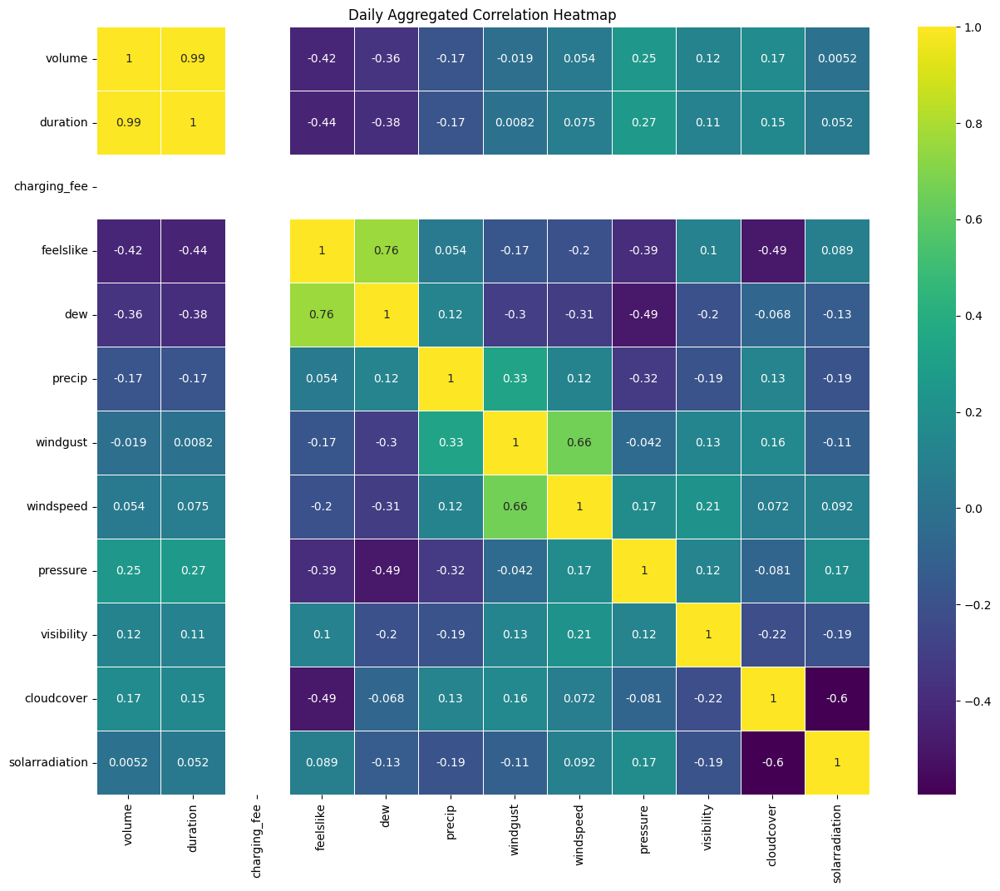

In [424]:
corr_matrix = daily_charging_df.corr()

plt.figure(figsize=(15,12))
sns.heatmap(corr_matrix, annot=True, linewidths=.5, cmap="viridis")
plt.title('Daily Aggregated Correlation Heatmap')
plt.show()

Once we aggreagte it on an hourly basis we start seeing some interesting stuff!

When we aggregate all the sites together for each hour of the day we can see a much greater correlation. Now we are getting into the land of asking important questions like: is the strong relationship a result of causation or correlation?

In [273]:
hourly_charging_df = charging_filtered_df.groupby(by=['time_str']).agg(
    {
        'volume':'sum',
        'duration':'sum',
        'charging_fee':'mean',
        'feelslike':'mean',
        'dew':'mean',
        'precip':'mean',
        'windgust':'mean',
        'windspeed':'mean',
        'pressure':'mean',
        'visibility':'mean',
        'cloudcover':'mean',
        'solarradiation':'mean'
    }).reset_index()

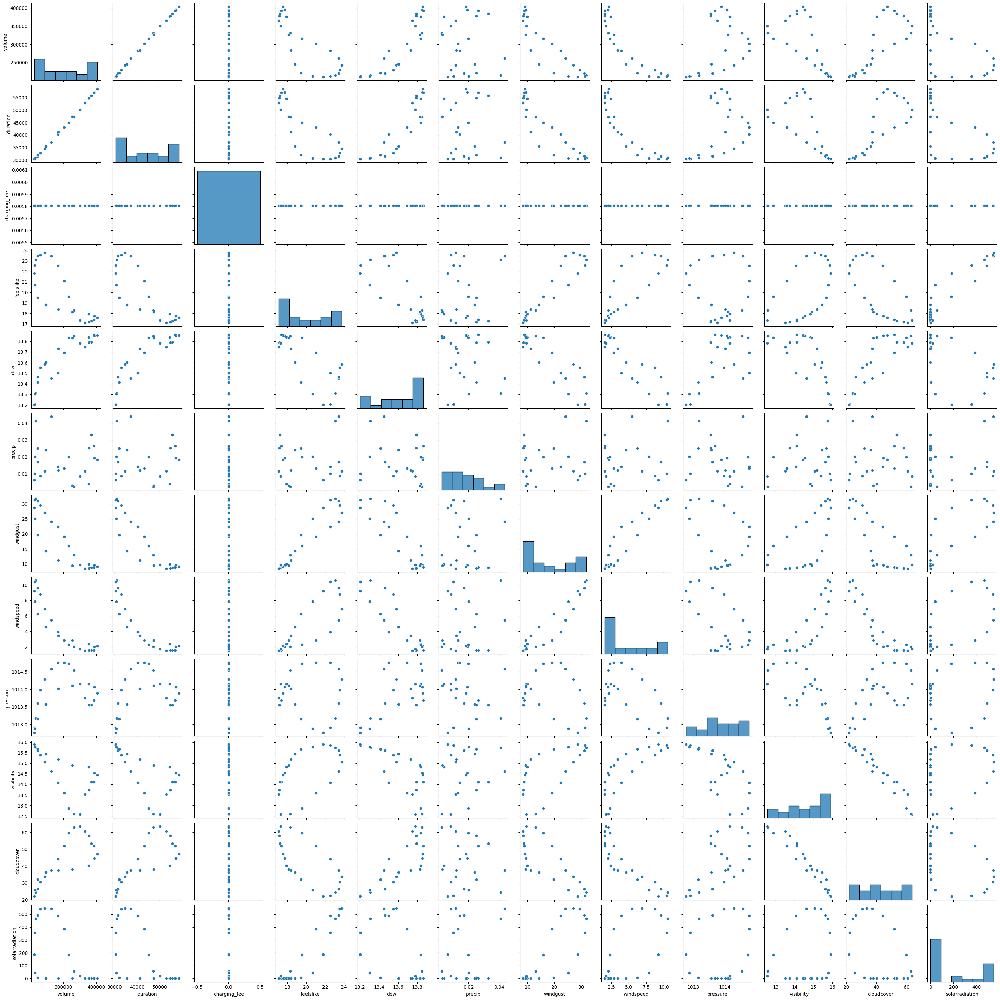

In [265]:
sns.pairplot(hourly_charging_df)

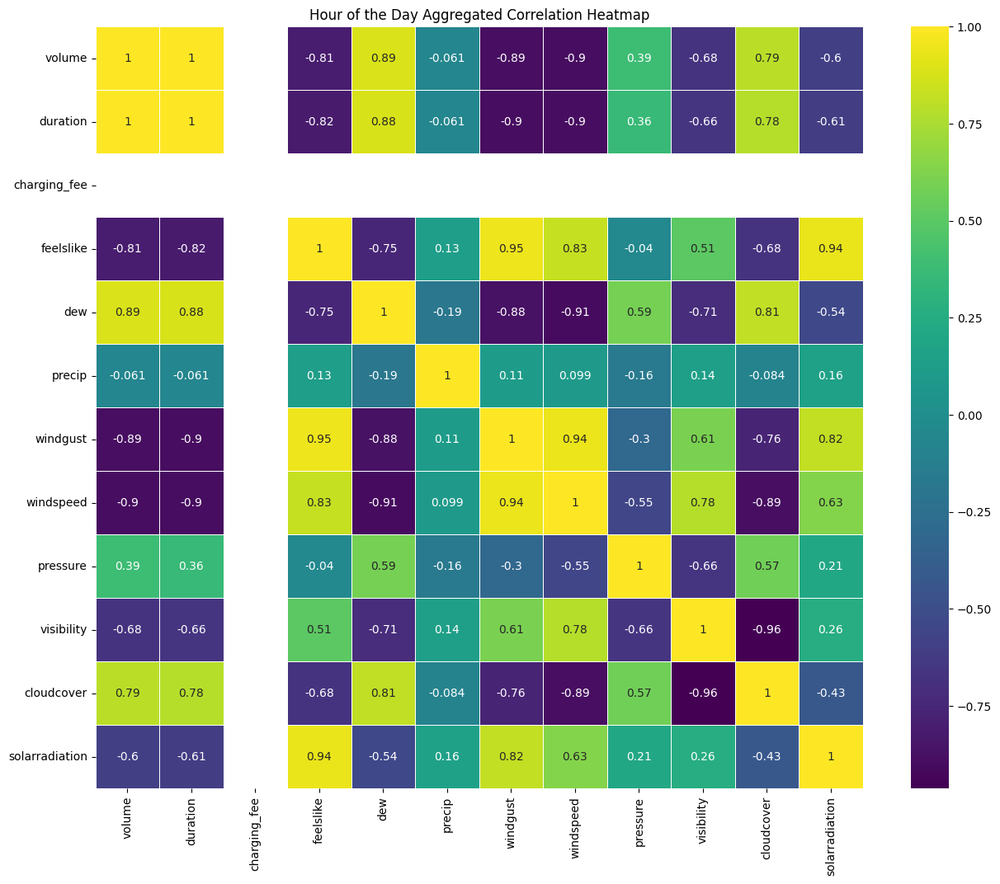

In [425]:
corr_matrix = hourly_charging_df.drop(columns='time_str').corr()

plt.figure(figsize=(15,12))
sns.heatmap(corr_matrix, annot=True, linewidths=.5, cmap="viridis")
plt.title('Hour of the Day Aggregated Correlation Heatmap')
plt.show()

We can also look at some other aspects of charging behaviour.

The plot below shows that customer's in Los Angeles generally charge more often in the morning and at night.

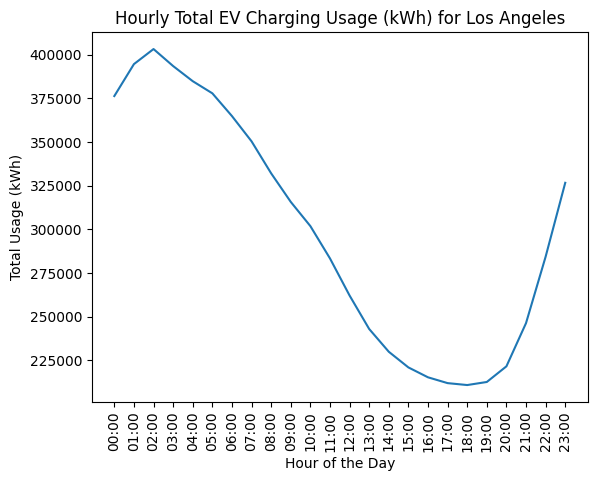

In [426]:
plt.figure()
plt.plot(hourly_charging_df['time_str'],hourly_charging_df['volume'])
plt.xticks(rotation=90)
plt.title("Hourly Total EV Charging Usage (kWh) for Los Angeles")
plt.xlabel('Hour of the Day')
plt.ylabel('Total Usage (kWh)')
plt.show()


We can further break the above plot into each site and stack them on top of each other. This lets us see how each inidivual site is contributing to the overall profile.

In [301]:
hourly_site_df = charging_filtered_df.groupby(by=['time_str','site_id']).agg(
    {
        'volume':'sum',
        'duration':'sum',
        'charging_fee':'mean',
        'feelslike':'mean',
        'dew':'mean',
        'precip':'mean',
        'windgust':'mean',
        'windspeed':'mean',
        'pressure':'mean',
        'visibility':'mean',
        'cloudcover':'mean',
        'solarradiation':'mean'
    }).reset_index()


fig = px.area(hourly_site_df, x='time_str',y='volume',color='site_id',line_group='site_id', height=600, width = 1000)
fig.update_layout(title='Hourly Total EV Charging Usage (kWh) per Site in Los Angeles', xaxis_title = 'Hour of Day', yaxis_title = 'Energy (kWh)')
fig.show()


Instead of looking at the hourly profile, we may want to look at the daily aggregation.

In [303]:
daily_site_df = charging_filtered_df.groupby(by=['date_str','site_id']).agg(
    {
        'volume':'sum',
        'duration':'sum',
        'charging_fee':'mean',
        'feelslike':'mean',
        'dew':'mean',
        'precip':'mean',
        'windgust':'mean',
        'windspeed':'mean',
        'pressure':'mean',
        'visibility':'mean',
        'cloudcover':'mean',
        'solarradiation':'mean'
    }).reset_index()


fig = px.area(daily_site_df, x='date_str',y='volume',color='site_id',line_group='site_id', height=600, width = 1000)
fig.update_layout(title='Daily Total EV Charging Usage (kWh) per Site in Los Angeles', xaxis_title = 'Day of Year', yaxis_title = 'Energy (kWh)')
fig.show()


We can also see which sites get used the most in a nice and simple bar graph.

In [304]:
fig = px.bar(site_charging_df, x='site_id',y='volume')
fig.update_layout(title='Total Energy Usage for Each Charger in Los Angeles', xaxis_title = 'Site ID', yaxis_title = 'Energy (kWh)')
fig.show()

This is starting to get more abstract. We can scale all the variables between 0 and 1 so that they are easily comparable on the one plot. We can select one or multiple of the variables in the right legend so we can see if there are any relationships between them over time. For example if you select 'volume' you can see there is a weekly repeating pattern. So maybe we should plot usage verse day of week? If you plot feelslike with volume you can see that as the feelslike rises, there is a drop in volume. This could also just be a coincidence as we are not looking at much data.

In [427]:
daily_charging_norm_df = (daily_charging_df - daily_charging_df.min()) / (daily_charging_df.max() - daily_charging_df.min())
daily_charging_long_df = daily_charging_norm_df.reset_index().melt(id_vars='date',var_name='variables',value_name='values')

fig = px.line(daily_charging_long_df,x='date',y='values', color='variables', line_group='variables')
fig.update_layout(title='Scaled Variables for Daily Aggregation of EV Charging in Los Angeles', xaxis_title = 'Date', yaxis_title = 'Scaled Value')
fig.show()

From the plot above we can see there seems to be a weekly repeating pattern in the volume and duration. So lets add a day of the week field and make some plots to see what kind of relationship there is.

In [414]:
dayofweek_df = charging_filtered_df.copy()

dayofweek_df['dayofweek'] = dayofweek_df['datetime'].dt.day_of_week

dayofweek_grouped_df = dayofweek_df.groupby(by=['dayofweek']).agg({'volume':'sum',}).reset_index()


In [428]:
fig = px.line(dayofweek_grouped_df, x='dayofweek',y='volume')
fig.update_layout(title='Day of the Week Total Usage (kWh) in Los Angeles', xaxis_title = 'Day of the Week', yaxis_title = 'Usage (kWh)')
fig.show()

We can also see which sites are most utilised. 

We can take the max volume for each site and assume this is the maximum charging possible at each of those sites. Ideally we would have a kW rating at each site, but we don't have this information. 

We can then use this max for each site to determine the % utilisation at each point. 

In [339]:
max_volume_per_site = charging_filtered_df.groupby(by='site_id').agg(max_volume=('volume','max')).reset_index()

In [433]:
site_utilisation_df = charging_filtered_df.merge(max_volume_per_site,how='left',on='site_id')

site_utilisation_df['utilisation'] = site_utilisation_df['volume']/site_utilisation_df['max_volume']

mean_site_utilisation = site_utilisation_df.groupby(by='site_id').agg(mean_utilisation = ('utilisation','mean')).reset_index()

mean_site_utilisation['mean_utilisation'] = mean_site_utilisation['mean_utilisation']*100

daily_site_utilisation = site_utilisation_df.groupby(by=['date','site_id']).agg(mean_utilisation = ('utilisation','mean')).reset_index()

daily_site_utilisation['mean_utilisation'] = daily_site_utilisation['mean_utilisation']*100

Sometimes have 100% utilisation, which is very weird. This most likely means there has been a data error.

In [434]:
fig = px.bar(mean_site_utilisation, x='site_id', y='mean_utilisation')
fig.update_layout(title='Average Utilisation for Each EV Charging Site in Los Angeles', xaxis_title = 'Site ID', yaxis_title = 'Utilisation (%)')
fig.show()

We can see which days of the year see the lowest utilisation

In [437]:
fig = px.area(daily_site_utilisation,x='date',y='mean_utilisation',color='site_id', line_group='site_id')
fig.update_layout(title='Average Utilisation Each Day for Each EV Charging Site in Los Angeles', xaxis_title = 'Date', yaxis_title = 'Utilisation (%)')
fig.show()